In [1]:
import torch
import torch.nn as nn
from torch_geometric.nn import GCNConv, GraphConv
from torch.nn.utils.parametrizations import weight_norm
from torch_geometric.nn import ChebConv
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch_geometric.utils import to_networkx
from torch_geometric.data import Data


import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, classification_report

import random
import glob
import os
import json
import pickle
import networkx as nx

import warnings
warnings.filterwarnings("ignore")

# Fix seed
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)

# Model

In [2]:
VERBOSE = False

In [3]:
class SimpleTemporalConv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding):
        super(SimpleTemporalConv, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, (1, kernel_size), stride=(1, stride), padding=(0, padding))
        self.conv2 = nn.Conv2d(in_channels, out_channels, (1, kernel_size), stride=(1, stride), padding=(0, padding))
        self.conv3 = nn.Conv2d(in_channels, out_channels, (1, kernel_size), stride=(1, stride), padding=(0, padding))
        
        self.batch_norm = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        x = x.permute(0, 3, 2, 1)  # (B, T, N, C) -> (B, C, N, T)
        
        P = self.conv1(x)
        Q = torch.sigmoid(self.conv2(x))
        PQ = P * Q
        PQ = self.batch_norm(PQ)
        x = F.leaky_relu(PQ + self.conv3(x))

        x=x.permute(0, 3, 2, 1)  # Back to (B, T, N, C)
        
        return x
    
    
    
class SimpleTemporalDeConv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding):
        super(SimpleTemporalDeConv, self).__init__()
        self.deconv1 = nn.ConvTranspose2d(in_channels, out_channels, (1, kernel_size), stride=(1, stride), padding=(0, padding))
        self.deconv2 = nn.ConvTranspose2d(in_channels, out_channels, (1, kernel_size), stride=(1, stride), padding=(0, padding))
        self.deconv3 = nn.ConvTranspose2d(in_channels, out_channels, (1, kernel_size), stride=(1, stride), padding=(0, padding))

    def forward(self, x):
        if VERBOSE: print("Temporal DeConv")
        
        x = x.permute(0, 3, 2, 1)  # (B, T, N, C) -> (B, C, N, T)
        
        P = self.deconv1(x)
        Q = torch.sigmoid(self.deconv2(x))
        PQ = P * Q
        x = F.leaky_relu(PQ + self.deconv3(x))
        
        x=x.permute(0, 3, 2, 1) # Back to (B, T, N, C)
        
        return x 


In [4]:
class SimpleSpatialConv(nn.Module):
    def __init__(self, in_channels, out_channels, K, normalization='sym', bias=False):
        super(SimpleSpatialConv, self).__init__()
        self.conv = ChebConv(in_channels, out_channels, K, normalization=normalization, bias=bias)

    def forward(self, x, edge_index, edge_weight):
        if VERBOSE: print("Spatial")
        
        if VERBOSE: print(x.shape)
        batch_size, time_steps, num_nodes, _ = x.size()
        output= torch.zeros([batch_size, time_steps, num_nodes, self.conv.out_channels]).to(x.device)

        for t in range(x.size(1)):
            output[:, t] = F.relu(self.conv(x[:, t], edge_index, edge_weight))
        
        if VERBOSE: print(output.shape)
        return output

In [5]:
class SimpleEncoder(nn.Module):
    def __init__(self, input_channels, hidden_channels, output_channels , kernel_size, stride, padding, K):
        super(SimpleEncoder, self).__init__()
        self.temporal_conv = SimpleTemporalConv(input_channels, input_channels, kernel_size, stride, padding)
        self.graph_conv = SimpleSpatialConv(input_channels, hidden_channels, K)
        self.temporal_conv_2 = SimpleTemporalConv(hidden_channels, output_channels, kernel_size, stride, padding)
        
    def forward(self, x, edge_index, edge_weight=None):
        x = self.temporal_conv(x)
        x = self.graph_conv(x, edge_index, edge_weight)
        x = self.temporal_conv_2(x)
        
        return x
        

class SimpleDecoder(nn.Module):
    def __init__(self, input_channels, hidden_channels, output_channels, kernel_size, stride, padding, K):    
        super(SimpleDecoder, self).__init__()
        self.temporal_deconv = SimpleTemporalDeConv(input_channels, input_channels, kernel_size, stride, padding)
        self.graph_deconv = SimpleSpatialConv(input_channels, hidden_channels, K)
        self.temporal_deconv_2 = SimpleTemporalDeConv(hidden_channels, output_channels, kernel_size, stride, padding)
        
    def forward(self, x, edge_index, edge_weight=None):
        x = self.temporal_deconv(x)
        x = self.graph_deconv(x, edge_index, edge_weight)
        x = self.temporal_deconv_2(x)
                
        return x
        

In [6]:
class SimpleSTConvAE(nn.Module):
    def __init__(self, device, channel_size_list, num_layers, 
                 kernel_size, K, stride, padding,\
                 normalization = 'sym' , bias = True):
        
        super(SimpleSTConvAE, self).__init__()
        self.layers = nn.ModuleList([])
        # add STConv blocks
        for l in range(num_layers):
            input_size, hidden_size, output_size = channel_size_list[l][0], channel_size_list[l][1], channel_size_list[l][2]
            if l==0:
                self.layers.append(SimpleEncoder(input_size, hidden_size, output_size, kernel_size, stride, padding, K))
            if l==1:
                self.layers.append(SimpleDecoder(input_size, hidden_size, output_size, kernel_size, stride, padding, K))
                
        for layer in self.layers:
            layer = layer.to(device)
            
    def forward(self, x, edge_index, edge_weight=None):
        
        latent_representation = self.layers[0](x, edge_index, edge_weight) # Encoder
        x_hat = self.layers[1](latent_representation, edge_index, edge_weight) # Decoder

        return x_hat, latent_representation
    
    


# Load data

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [8]:
DATA_PATH = 'data/subdata_extended'

MODEL_PATH = f'new_models/temporal_sandwich_model_with_gate_data_shuffled_edge_weight_batch_2_subdata_extended_batch_norm_combined_loss_leakyReluActivactionFunction'

In [9]:
# Input [batch_size, time_steps, num_nodes, num_features]
def load_data(FOLDER, CORRUPT_FOLDER=None, CORRUPT_PROB=0.0, seed=42):
    if seed:
        random.seed(seed)
        np.random.seed(seed)
        torch.manual_seed(seed)
    
    file_paths = glob.glob(f'{FOLDER}/node_features_*.pt')  # Percorso per tutti i file CSV
    num_files = len(file_paths)
    step = 1  # Offset per la finestra scorrevole

    # Carica tutti i file in una lista
    all_data = [torch.load(file_path) for file_path in file_paths]  # Ogni file è (num_nodes, num_features)
    all_data_corr = all_data.copy()

    if CORRUPT_FOLDER:
        indices = np.zeros(len(all_data_corr))
        corrupt_file_paths = glob.glob(f'{CORRUPT_FOLDER}/node_features_*.pt')
        corrupt_data = [torch.load(file_path) for file_path in corrupt_file_paths]
        for i in range(len(all_data_corr)):
            if random.random() < CORRUPT_PROB:
                all_data_corr[i] = corrupt_data[i]
                indices[i] = 1

    # Numero di nodi e feature dai dati
    num_nodes, num_features = all_data[0].shape

    # Crea le finestre temporali
    windows = []
    windows_corr = []
    indices_stacked = []
    for i in range(0, num_files - TIME_STEPS + 1, step):
        window = torch.stack(all_data[i:i + TIME_STEPS], dim=0)  # Raggruppa 10 giorni
        windows.append(window)

        if CORRUPT_FOLDER:
            window_corr = torch.stack(all_data_corr[i:i + TIME_STEPS], dim=0)
            windows_corr.append(window_corr)
            indices_stacked.append(int(indices[i:i + TIME_STEPS].sum()))

    # Concatena le finestre temporali
    data = torch.stack(windows, dim=0)

    if CORRUPT_FOLDER:
        data_corr = torch.stack(windows_corr, dim=0)

        # Shuffle data and indices together
        combined = list(zip(data, indices_stacked, data_corr))
        random.shuffle(combined)
        data, indices_stacked, data_corr = zip(*combined)

        # Convert back to tensors and lists
        data = torch.stack(data)
        data_corr = torch.stack(data_corr)
        indices_stacked = list(indices_stacked)

        return data, indices_stacked, data_corr

    # Shuffle data if no corrupt folder is used
    data = data[torch.randperm(data.size(0))]

    return data, num_nodes, num_features


In [10]:
TRAIN_RATIO = 0.7  # Training ratio
VAL_RATIO = 0.15  # Validation ratio
TEST_RATIO = 0.15  # Test ratio

TRAIN_BATCH_SIZE = 2  # Batch size training
VAL_BATCH_SIZE = 2  # Batch size validation
TEST_BATCH_SIZE = 1  # Batch size test

TIME_STEPS = 4*4  # Number of time steps (DAYS)

In [11]:
data, num_nodes, num_features= load_data(DATA_PATH)

In [12]:
edge_index = torch.load('node_connections/edge_index.pt').to(device)
edge_weight = torch.load('node_connections/edge_weight.pt').to(device)

edge_index.shape, edge_weight.shape

(torch.Size([2, 12564]), torch.Size([12564]))

In [13]:
# Create train, validation and test sets
train_data = data[:int(TRAIN_RATIO*len(data))]
val_data = data[int(TRAIN_RATIO*len(data)):int((TRAIN_RATIO+VAL_RATIO)*len(data))]
test_data = data[int((TRAIN_RATIO+VAL_RATIO)*len(data)):]

train_loader = DataLoader(train_data, batch_size=TRAIN_BATCH_SIZE, shuffle=False)
val_loader = DataLoader(val_data, batch_size=VAL_BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_data, batch_size=TEST_BATCH_SIZE, shuffle=False)

print(train_data.shape)
print(val_data.shape)
print(test_data.shape)

print(edge_index.shape)

print(f'Number of training batches: {len(train_loader)}')
print(f'Number of validation batches: {len(val_loader)}')
print(f'Number of test batches: {len(test_loader)}')


torch.Size([161, 16, 1657, 8])
torch.Size([34, 16, 1657, 8])
torch.Size([35, 16, 1657, 8])
torch.Size([2, 12564])
Number of training batches: 81
Number of validation batches: 17
Number of test batches: 35


In [14]:
# Print info overall
print(f"Number of training graphs: {len(train_data)}")
print(f"Number of validation graphs: {len(val_data)}")
print(f"Number of test graphs: {len(test_data)}")
print()
#Print info for each graph

data=train_data[0]
print(f"Graph: {data.size()}")
print(f"Number of time series: {data.size(0)}")
print(f"Number of nodes: {data.size(1)}")
print(f"Number of features: {data.size(2)}")
print(f"Number of edges: {edge_index.size(1)}")
print(f"Edge index shape: {edge_index.shape}")
print(f"Edge weight shape: {edge_weight.shape}")
print()
    
print(f"Number of training batches: {len(train_loader)}")
print(f"Number of validation batches: {len(val_loader)}")
print(f"Number of test batches: {len(test_loader)}")


Number of training graphs: 161
Number of validation graphs: 34
Number of test graphs: 35

Graph: torch.Size([16, 1657, 8])
Number of time series: 16
Number of nodes: 1657
Number of features: 8
Number of edges: 12564
Edge index shape: torch.Size([2, 12564])
Edge weight shape: torch.Size([12564])

Number of training batches: 81
Number of validation batches: 17
Number of test batches: 35


# Loss

In [15]:
def edge_weight_preservation_loss(latent_representation, edge_index, edge_weight=None):
    """
    Computes edge weight preservation loss across temporal windows.

    Args:
        latent_representation (torch.Tensor): Latent representation (B, T, N, F).
        edge_index (torch.Tensor): Edge index tensor (2, num_edges).
        edge_weight (torch.Tensor): Edge weights (num_edges), optional.

    Returns:
        torch.Tensor: Edge weight preservation loss.
    """
    batch_size, time_steps, num_nodes, num_features = latent_representation.shape
    total_loss = 0.0

    for t in range(time_steps):
        # Latent representations for timestep t
        z_t = latent_representation[:, t]  # Shape (B, N, F)
        
        # Get edge representations for each edge
        node_i = z_t[:, edge_index[0]]  # Shape (B, num_edges, F)
        node_j = z_t[:, edge_index[1]]  # Shape (B, num_edges, F)

        # Compute Euclidean distance ||Z_i - Z_j||_2
        edge_distance = torch.norm(node_i - node_j, p=2, dim=-1)

        # If no edge weights provided, assume all weights are 1
        if edge_weight is None:
            edge_weight = torch.ones(edge_distance.size()).to(latent_representation.device)

        # Loss for timestep t: (weight - distance)^2
        loss_t = torch.mean((edge_weight - edge_distance) ** 2)
        total_loss += loss_t

    # Average loss across time and batch
    return total_loss / (batch_size * time_steps)


In [16]:
def pairwise_similarity_loss(latent_representation, edge_index):
    """
    Computes pairwise cosine similarity loss across temporal windows.

    Args:
        latent_representation (torch.Tensor): Latent representation (B, T, N, F).
        edge_index (torch.Tensor): Edge index tensor (2, num_edges).

    Returns:
        torch.Tensor: Pairwise similarity loss.
    """
    batch_size, time_steps, num_nodes, num_features = latent_representation.shape
    total_loss = 0.0

    for t in range(time_steps):
        # Latent representations for timestep t
        z_t = latent_representation[:, t]  # Shape (B, N, F)

        # Latent representations for edge nodes
        node_i = z_t[:, edge_index[0]]  # Shape (B, num_edges, F)
        node_j = z_t[:, edge_index[1]]  # Shape (B, num_edges, F)

        # Cosine similarity
        cos_sim = torch.nn.functional.cosine_similarity(node_i, node_j, dim=-1)

        # Loss for timestep t: 1 - cosine similarity
        loss_t = torch.mean(1 - cos_sim)
        total_loss += loss_t

    # Average loss across time and batch
    return total_loss / (batch_size * time_steps)


In [17]:
def reconstruction_loss(original_features, reconstructed_features):
    """
    Computes node feature reconstruction loss across temporal windows.

    Args:
        original_features (torch.Tensor): Original features (B, T, N, F).
        reconstructed_features (torch.Tensor): Reconstructed features (B, T, N, F).

    Returns:
        torch.Tensor: Reconstruction loss.
    """
    return torch.nn.functional.mse_loss(reconstructed_features, original_features)


In [18]:
def combined_loss(reconstructed_features, latent_representation, original_features):
    """
    Computes a combined graph-specific loss across temporal windows.

    Args:
        latent_representation (torch.Tensor): Latent representation (B, T, N, F).
        edge_index (torch.Tensor): Edge index tensor (2, num_edges).
        edge_weight (torch.Tensor): Edge weights (num_edges), optional.
        original_features (torch.Tensor): Original node features (B, T, N, F).
        reconstructed_features (torch.Tensor): Reconstructed node features (B, T, N, F).

    Returns:
        torch.Tensor: Total loss.
    """
    # Individual losses
    edge_loss = edge_weight_preservation_loss(latent_representation, edge_index, edge_weight)
    sim_loss = pairwise_similarity_loss(latent_representation, edge_index)
    recon_loss = reconstruction_loss(original_features, reconstructed_features)

    # Weighting factors
    lambda_edge = 1.0
    lambda_sim = 1.0
    lambda_recon = 1.0

    # Combined loss
    total_loss = (
                  lambda_edge * edge_loss +
                  lambda_sim * sim_loss +
                  lambda_recon * recon_loss)

    return total_loss


# Load Model

In [19]:
criterion = combined_loss

In [20]:
# Parameters
filters_list = [[num_features, 16, 32], [32, 16, num_features]]
num_layers = 2
kernel_size = 4             # Temporal convolution kernel size
stride = 2                 # Temporal convolution stride
padding = 1                 # Temporal convolution padding
K = 3                       # Chebyshev polynomial order for graph convolution
num_epochs = 150

model = SimpleSTConvAE(
        device, 
        filters_list, 
        num_layers, 
        kernel_size, 
        K,
        stride, 
        padding
    ).to(device)

sum(p.numel() for p in model.parameters() if p.requires_grad)

22976

In [21]:
model 
model.load_state_dict(torch.load(MODEL_PATH+'/best_model.pth'))
model.to(device)

SimpleSTConvAE(
  (layers): ModuleList(
    (0): SimpleEncoder(
      (temporal_conv): SimpleTemporalConv(
        (conv1): Conv2d(8, 8, kernel_size=(1, 4), stride=(1, 2), padding=(0, 1))
        (conv2): Conv2d(8, 8, kernel_size=(1, 4), stride=(1, 2), padding=(0, 1))
        (conv3): Conv2d(8, 8, kernel_size=(1, 4), stride=(1, 2), padding=(0, 1))
        (batch_norm): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (graph_conv): SimpleSpatialConv(
        (conv): ChebConv(8, 16, K=3, normalization=sym)
      )
      (temporal_conv_2): SimpleTemporalConv(
        (conv1): Conv2d(16, 32, kernel_size=(1, 4), stride=(1, 2), padding=(0, 1))
        (conv2): Conv2d(16, 32, kernel_size=(1, 4), stride=(1, 2), padding=(0, 1))
        (conv3): Conv2d(16, 32, kernel_size=(1, 4), stride=(1, 2), padding=(0, 1))
        (batch_norm): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (1): SimpleDecoder(
    

# Funcs

In [22]:
def detect_anomalies(model, test_loader, criterion, threshold=None, device=device):
    model.eval()
    losses = []

    with torch.no_grad():
        for data in test_loader:
            data = data.to(device)  # Move data to device
            output,latent = model(data, edge_index, edge_weight)
            loss = criterion(output, latent, data)
            losses.append(loss.item())

    
    # Se non fornisci un threshold, usiamo ad esempio la media + 2*deviazione standard come soglia
    if threshold is None:
        threshold = np.mean(losses) #+ 1 * np.std(losses)
    
    # Identifica le anomalie
    anomalies = [i for i, loss in enumerate(losses) if loss > threshold]
    
    return losses, threshold, anomalies


In [23]:
mapping_variables = {
    0 : 'solar_zenith_angle',
    1 : 'solar_azimuth_angle',
    2 : 'surf_air_temp_masked',
    3 : 'surf_temp_masked',
    4 : 'surf_spec_hum_masked',
    5 : 'h2o_vap_tot_masked',
    6 : 'cloud_liquid_water_masked',
    7 : 'atmosphere_mass_content_of_cloud_ice_masked'
}

# Temporal corruption

In [101]:
corruption_level = 0.3
variables = [1, 7]  # Features to corrupt
variables.sort()
FOLDER_CORRUPTION = '_'.join([str(mapping_variables[variable]) for variable in variables])
DATA_PATH_TEST = 'data/subdata_extended'
DATA_PATH_CORRUPTED = 'data/subdata_extended_corrupted/'

data, indices, data_corrupted= load_data(DATA_PATH_TEST,DATA_PATH_CORRUPTED+FOLDER_CORRUPTION, corruption_level)
test_data = data[int((TRAIN_RATIO+VAL_RATIO)*len(data)):]
test_loader = DataLoader(test_data, batch_size=TEST_BATCH_SIZE, shuffle=False)
print(test_data.shape)

indices = indices[int((TRAIN_RATIO+VAL_RATIO)*len(data_corrupted)):]
data_corrupted = data_corrupted[int((TRAIN_RATIO+VAL_RATIO)*len(data_corrupted)):]

mixed_loader = DataLoader(data_corrupted, batch_size=TEST_BATCH_SIZE, shuffle=False)

torch.Size([35, 16, 1657, 8])


In [102]:
# Esegui il rilevamento delle anomalie
test_losses, anomaly_threshold, anomalies  = detect_anomalies(model, test_loader, criterion, threshold=None, device=device)

print(f"Anomaly Threshold: {anomaly_threshold}")
print(f"Detected Anomalies at indices: {anomalies}")

Anomaly Threshold: 0.12101352896009172
Detected Anomalies at indices: [5, 6, 7, 8, 11, 12, 14, 16, 20, 24, 26, 29, 30, 31, 32]


In [103]:
# Detect anomalies in the mixed data
mixed_losses, _, mixed_anomalies = detect_anomalies(model, mixed_loader, criterion, threshold=anomaly_threshold)

print(f"Detected Anomalies in Mixed Data at indices: {mixed_anomalies}")

Detected Anomalies in Mixed Data at indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33]


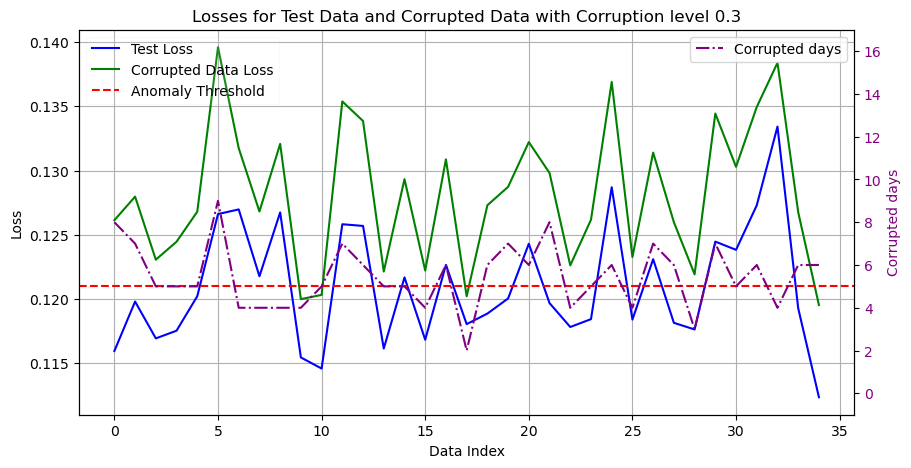

In [104]:
# Plot the losses for the test data and corrupted data with separate axes
fig, ax1 = plt.subplots(figsize=(10, 5))

# Primary y-axis for losses
ax1.plot(test_losses, label='Test Loss', color='blue')
ax1.plot(mixed_losses, label='Corrupted Data Loss', color='green')
ax1.axhline(anomaly_threshold, color='red', linestyle='--', label='Anomaly Threshold')
ax1.set_xlabel('Data Index')
ax1.set_ylabel('Loss')
ax1.legend(loc='upper left', framealpha=0.1)
ax1.grid(True)
ax1.set_title('Losses for Test Data and Corrupted Data with Corruption level ' + str(corruption_level))

# Secondary y-axis for indices
ax2 = ax1.twinx()
ax2.plot(indices, label='Corrupted days', color='purple', linestyle='-.')
ax2.set_ylabel('Corrupted days', color='purple')
ax2.tick_params(axis='y', labelcolor='purple')
ax2.set_ylim(-1, 17)  # Set the range of indices between 0 and 16
ax2.legend(loc='upper right')

# Save the plot
# plt.savefig(MODL+'/test_corrupted_losses.png')

# Show the plot
plt.show()


In [105]:
# Define the total number of data points (adjust if needed)
total_data_points = len(test_data)

# Create binary lists for actual and predicted anomalies
actual_anomalies = [1 if i>0 else 0 for i in indices]
predicted_anomalies = [1 if i in mixed_anomalies else 0 for i in range(total_data_points)]

# Calculate the metrics
accuracy = accuracy_score(actual_anomalies, predicted_anomalies)
recall = recall_score(actual_anomalies, predicted_anomalies)
precision = precision_score(actual_anomalies, predicted_anomalies)
f1 = f1_score(actual_anomalies, predicted_anomalies)

# Print the results
print(f"Accuracy: {accuracy}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")
print(f"F1 Score: {f1}")

# Save the results
results = {
    'Accuracy': accuracy,
    'Recall': recall,
    'Precision': precision,
    'F1 Score': f1,
}

# with open(FOLDER_MODEL_SAVE+'/metrics.json', 'w') as f:
#     json.dump(results, f, indent=4)

Accuracy: 0.8857142857142857
Recall: 0.8857142857142857
Precision: 1.0
F1 Score: 0.9393939393939394


In [106]:
print(classification_report(actual_anomalies, predicted_anomalies, target_names=['Normal', 'Anomaly'],labels=[0,1]))

              precision    recall  f1-score   support

      Normal       0.00      0.00      0.00         0
     Anomaly       1.00      0.89      0.94        35

    accuracy                           0.89        35
   macro avg       0.50      0.44      0.47        35
weighted avg       1.00      0.89      0.94        35



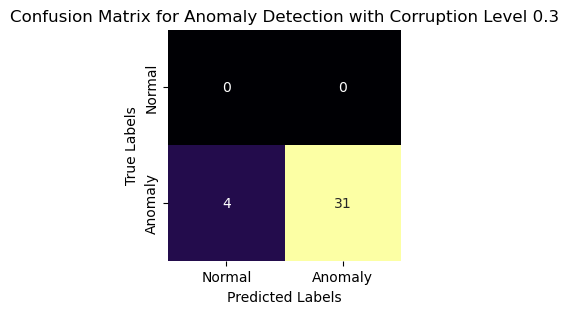

In [107]:
# Plot the confusion matrix
cf = confusion_matrix(actual_anomalies, predicted_anomalies, labels=[0, 1])

plt.figure(figsize=(3,3))
sns.heatmap(cf, annot=True, fmt='d', cmap='inferno', cbar=False,
            xticklabels=['Normal', 'Anomaly'], yticklabels=['Normal', 'Anomaly'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Anomaly Detection with Corruption Level ' + str(corruption_level))

# plt.savefig(FOLDER_MODEL_SAVE+'/confusion_matrix.png')

plt.show()

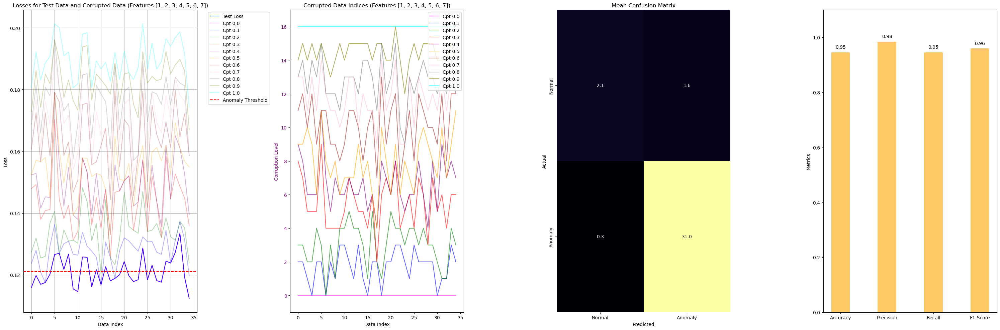

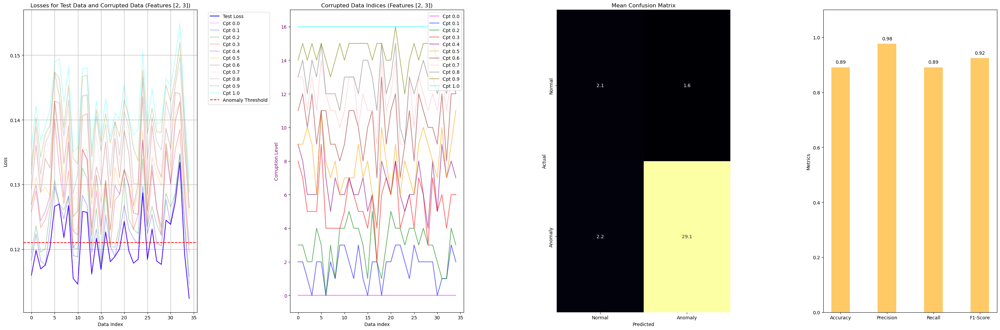

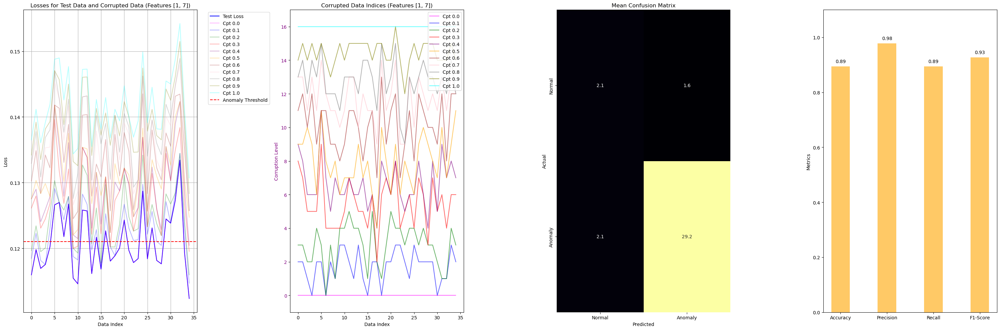

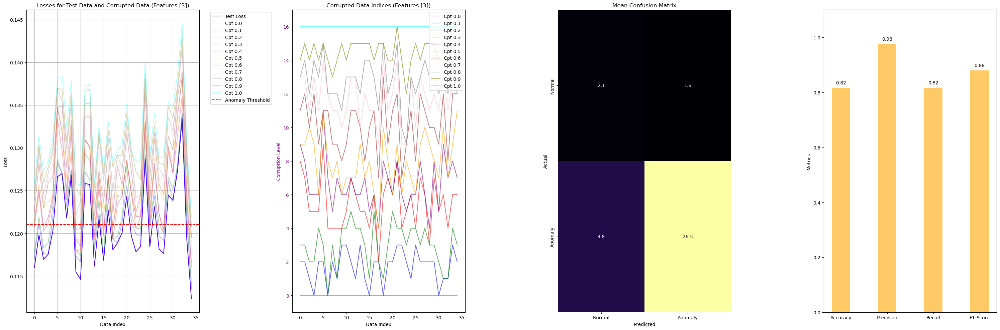

In [108]:
corruption_levels = [i / 10 for i in range(11)]  # Levels from 0.1 to 1.0
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan', 'magenta']

# Loop through each pair of feature indices
for pair in [[1,2,3,4,5,6,7],[2,3],[1,7],[3]]:
    fig, axes = plt.subplots(1, 4, figsize=(30, 10))  # Three subplots: losses, corrupted data, and metrics

    ax1, ax2, ax3, ax4= axes

    # Original test losses
    ax1.plot(test_losses, label='Test Loss', color='blue')

    mean_class_rep = []
    mean_cm = []

    # Loop through corruption levels
    for corruption_level in corruption_levels:
        # Sort features without modifying the original `pair`
        sorted_pair = sorted(pair)

        # Generate folder corruption name
        FOLDER_CORRUPTION = '_'.join([str(mapping_variables[var]) for var in sorted_pair])

        # Load corrupted data
        _, indices, data_corrupted = load_data(DATA_PATH_TEST, DATA_PATH_CORRUPTED+FOLDER_CORRUPTION, corruption_level)
        indices = indices[int((TRAIN_RATIO + VAL_RATIO) * len(data_corrupted)):]
        data_corrupted = data_corrupted[int((TRAIN_RATIO + VAL_RATIO) * len(data_corrupted)):]

        corrupted_loader = DataLoader(data_corrupted, batch_size=TEST_BATCH_SIZE, shuffle=False)

        # Detect anomalies in the corrupted data
        corrupted_losses, _, corrupted_anomalies = detect_anomalies(model, corrupted_loader, criterion, threshold=anomaly_threshold)

        # Plot corrupted losses
        color_idx = min(int(corruption_level * 10) - 1, len(colors) - 1)
        ax1.plot(corrupted_losses, label=f'Cpt {corruption_level:.1f}', alpha=0.3, color=colors[color_idx])
        ax2.plot(indices, alpha=0.6, label=f'Cpt {corruption_level:.1f}', color=colors[color_idx])

        # Metrics calculations
        actual_anomalies = [1 if i > 0 else 0 for i in indices]
        predicted_anomalies = [1 if i in corrupted_anomalies else 0 for i in range(len(indices))]

        # Classification report and confusion matrix
        class_rep = classification_report(actual_anomalies, predicted_anomalies, target_names=['Normal', 'Anomaly'], output_dict=True, labels=[0, 1])
        cm = confusion_matrix(actual_anomalies, predicted_anomalies, labels=[0, 1])

        mean_class_rep.append(class_rep)
        mean_cm.append(cm)
  
    # Calculate mean metrics
    mean_cm = np.mean(mean_cm, axis=0)

    mean_accuracy = np.mean([rep['accuracy'] for rep in mean_class_rep])
    
    # Save list of reports
    # with open(FOLDER_MODEL_SAVE + f'/corrupted_reports_{sorted_pair}.json', 'w') as f:
    #     json.dump(mean_class_rep, f, indent=4)

    # Prepare metrics for the bar plot
    mean_class_rep = {
        metric: np.mean([rep['weighted avg'][metric] for rep in mean_class_rep])
        for metric in ['precision', 'recall', 'f1-score']
    }

    

    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    metric_values = [mean_accuracy] + [mean_class_rep[m] for m in ['precision', 'recall', 'f1-score']]

    # Plot mean confusion matrix as heatmap
    sns.heatmap(mean_cm, annot=True, fmt='.1f', cmap='inferno', cbar=False,
            xticklabels=['Normal', 'Anomaly'], yticklabels=['Normal', 'Anomaly'], ax=ax3)
    ax3.set_title('Mean Confusion Matrix')
    ax3.set_xlabel('Predicted')
    ax3.set_ylabel('Actual')
    
    # Add bar plot to the same subplot
    ax4.bar(metrics, metric_values, alpha=0.6, color='orange', width=0.4)
    ax4.set_ylim(0, 1.1)
    ax4.set_ylabel('Metrics')
    
    # Print the legend with the values in ax4
    for i, v in enumerate(metric_values):
        ax4.text(i, v + 0.01, f'{v:.2f}', ha='center', va='bottom')

    # Plot threshold and titles
    ax1.axhline(anomaly_threshold, color='red', linestyle='--', label='Anomaly Threshold')
    ax1.set_xlabel('Data Index')
    ax1.set_ylabel('Loss')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.grid(True)
    ax1.set_title(f'Losses for Test Data and Corrupted Data (Features {pair})')

    # Secondary plot: corrupted indices
    ax2.set_ylabel('Corruption Level', color='purple')
    ax2.tick_params(axis='y', labelcolor='purple')
    ax2.set_ylim(-1, 17)
    ax2.legend(loc='upper right')
    ax2.set_xlabel('Data Index')
    ax2.set_title(f'Corrupted Data Indices (Features {pair})')

    plt.tight_layout()

    # plt.savefig(FOLDER_MODEL_SAVE + f'/corrupted_losses_{FOLDER_CORRUPTION}.png')
    
    plt.show()


# Space analysis

In [35]:
corruption_level = 0.1
DATA_PATH_TEST = 'data/subdata_extended'
DATA_PATH_CORRUPTED = 'data/subdata_extended_corrupted_50km/'

data, indices, data_corrupted= load_data(DATA_PATH_TEST,DATA_PATH_CORRUPTED, corruption_level)
test_data = data[int((TRAIN_RATIO+VAL_RATIO)*len(data)):]
test_loader = DataLoader(test_data, batch_size=TEST_BATCH_SIZE, shuffle=False)
print(test_data.shape)

indices = indices[int((TRAIN_RATIO+VAL_RATIO)*len(data_corrupted)):]
data_corrupted = data_corrupted[int((TRAIN_RATIO+VAL_RATIO)*len(data_corrupted)):]

mixed_loader = DataLoader(data_corrupted, batch_size=TEST_BATCH_SIZE, shuffle=False)

torch.Size([35, 16, 1657, 8])


In [46]:
import os
import torch
import matplotlib.pyplot as plt


# Compute the difference
data_difference = test_data-data_corrupted

# Convert data_difference to a PyTorch tensor and compute the mean
data_difference_tensor = torch.tensor(data_difference, dtype=torch.float32)
data_mean = torch.mean(data_difference_tensor[0, :, :, :], dim=0)

# # Plot the feature differences for each node
# num_features = data_difference.shape[-1]
# fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# for i, ax in enumerate(axes.flat):
#     if i < num_features:
#         # Plot the i-th feature for all nodes and time steps
#         feature_data = data_mean  # Shape: [16, num_nodes]
#         ax.plot(feature_data.numpy())
#         ax.set_title(f'Feature {i}')
#         ax.set_xlabel('Node Index')
#         ax.set_ylabel('Feature Value')
#     else:
#         ax.axis('off')  # Turn off unused subplots

# plt.tight_layout()
# plt.show()


In [37]:
edge_index = torch.load('node_connections/edge_index.pt').to(device)
edge_weight = torch.load('node_connections/edge_weight.pt').to(device)

# Utils for plotting
node_mapping = pickle.load(open('node_connections/node_mapping.pkl', 'rb'))
node_ids = pickle.load(open('node_connections/node_ids.pkl', 'rb'))

data = Data(x=data_mean, edge_index=edge_index, edge_attr=edge_weight)

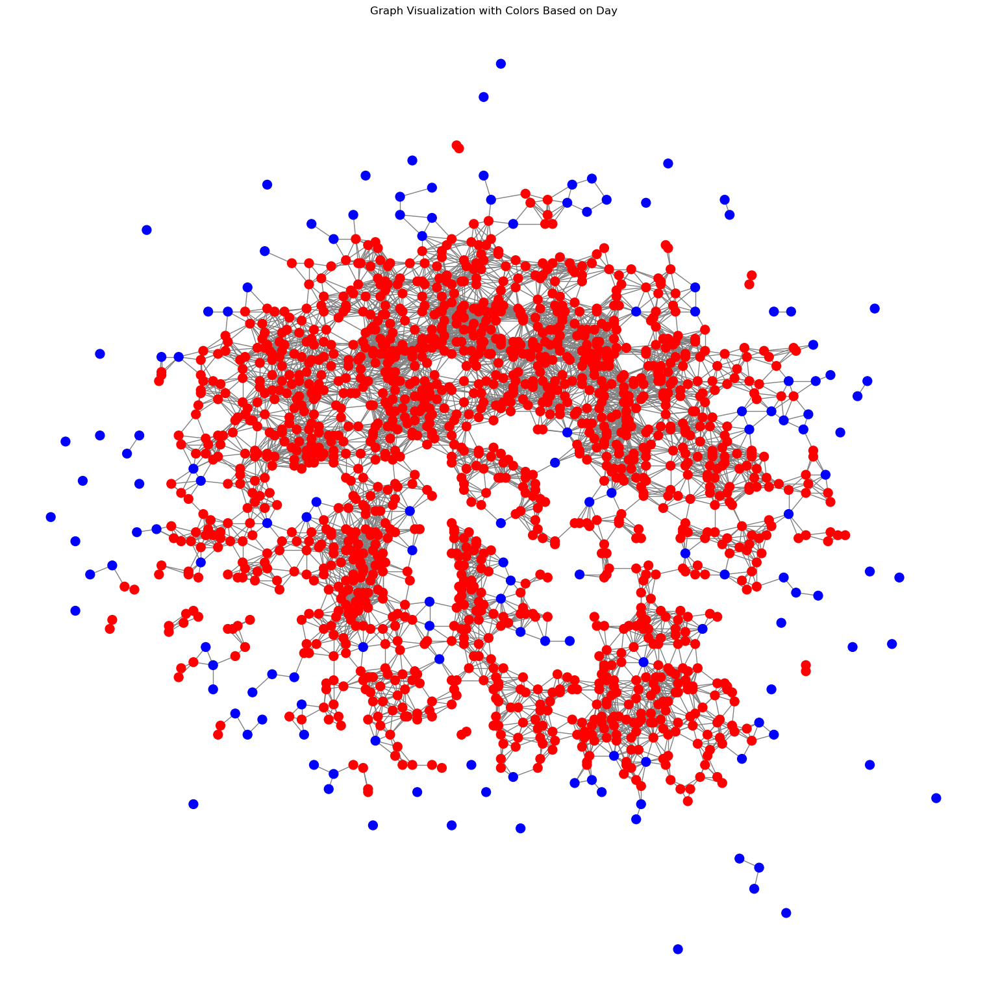

In [38]:
# Convert the PyTorch Geometric data object to a NetworkX graph
G = to_networkx(data, to_undirected=True)

# If data features sum is zero, color node in red
node_colors = ['blue' if data.x[node_mapping[node_id]].sum() == 0 else 'red' for node_id in node_ids]

# Create a dictionary with (lat, lon) positions for each node
positions = {node_mapping[node_id]: (node_id[1], node_id[0]) for node_id in node_ids}  # (lon, lat) for x, y
for i in G.nodes:
    if i not in positions:
        positions[i] = (0, 0)

default_color = 0  # Default color index for nodes without a specific day

# Create a label dictionary with (lat, lon, day) as labels for each node
labels = {node_mapping[node_id]: f"{node_id[0]:.2f}, {node_id[1]:.2f}" for node_id in node_ids}
labels = {node_mapping[node_id]: "" for node_id in node_ids}

# Plot the graph
plt.figure(figsize=(15, 15))
nx.draw(G, pos=positions, with_labels=True, labels=labels, node_size=100,
        font_size=10, node_color=node_colors, cmap='coolwarm', edge_color='gray', font_color='black')
plt.title("Graph Visualization with Colors Based on Day")
plt.show()



In [39]:
# Esegui il rilevamento delle anomalie
test_losses, anomaly_threshold, anomalies  = detect_anomalies(model, test_loader, criterion, threshold=None, device=device)

print(f"Anomaly Threshold: {anomaly_threshold}")
print(f"Detected Anomalies at indices: {anomalies}")

Anomaly Threshold: 0.12101352981158665
Detected Anomalies at indices: [5, 6, 7, 8, 11, 12, 14, 16, 20, 24, 26, 29, 30, 31, 32]


In [40]:
# Detect anomalies in the mixed data
mixed_losses, _, mixed_anomalies = detect_anomalies(model, mixed_loader, criterion, threshold=anomaly_threshold)

print(f"Detected Anomalies in Mixed Data at indices: {mixed_anomalies}")

Detected Anomalies in Mixed Data at indices: [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]


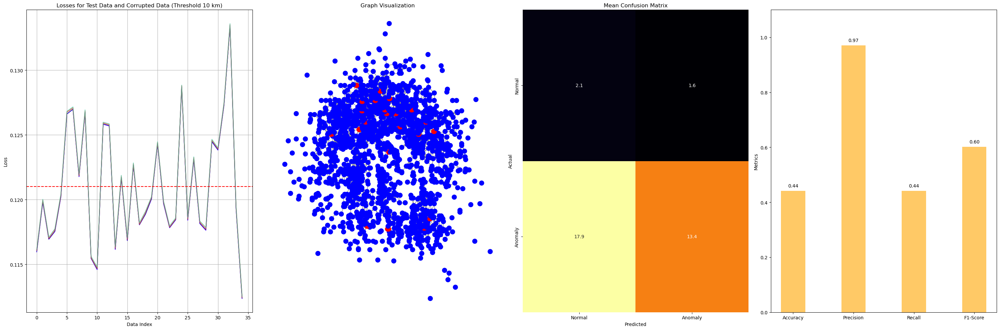

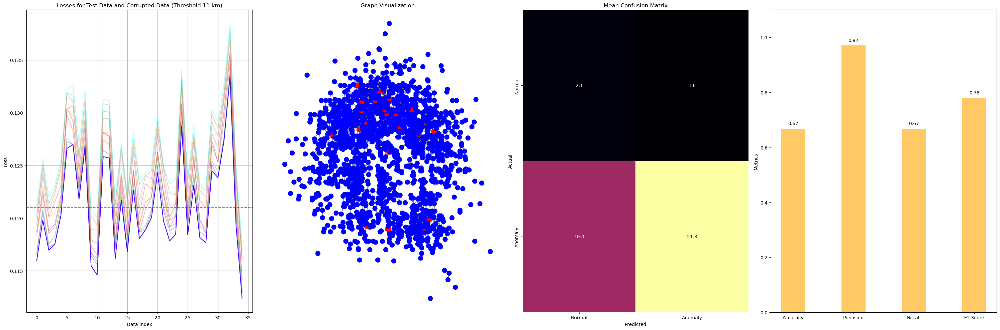

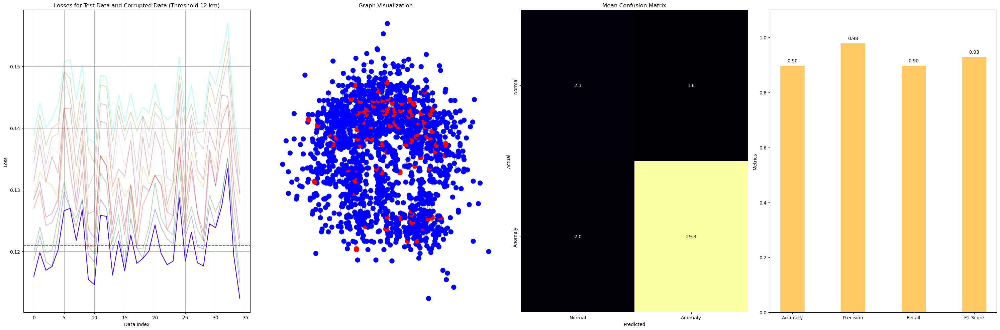

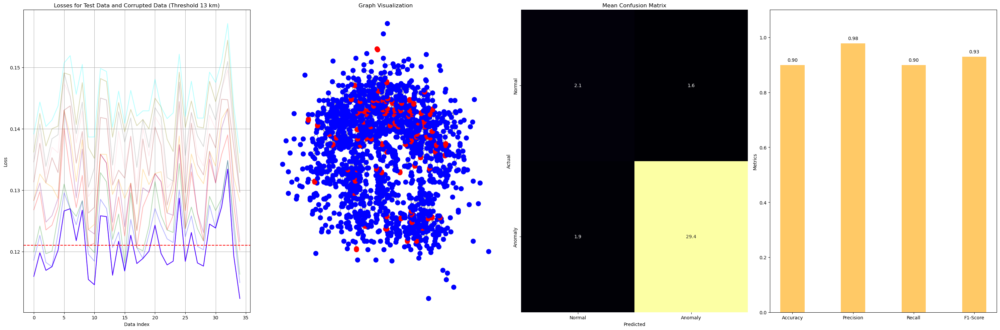

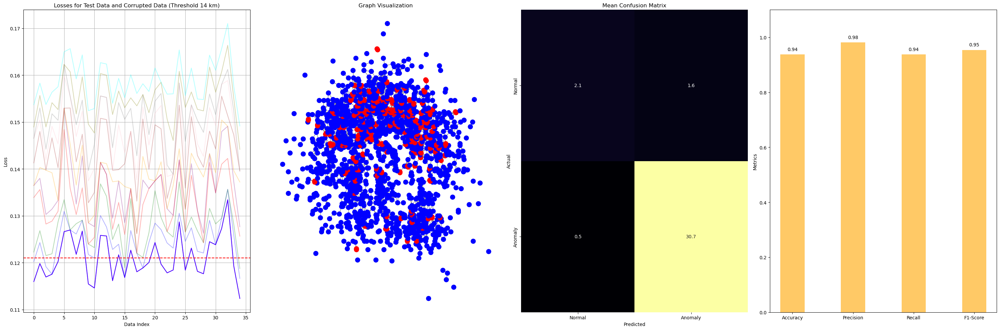

...

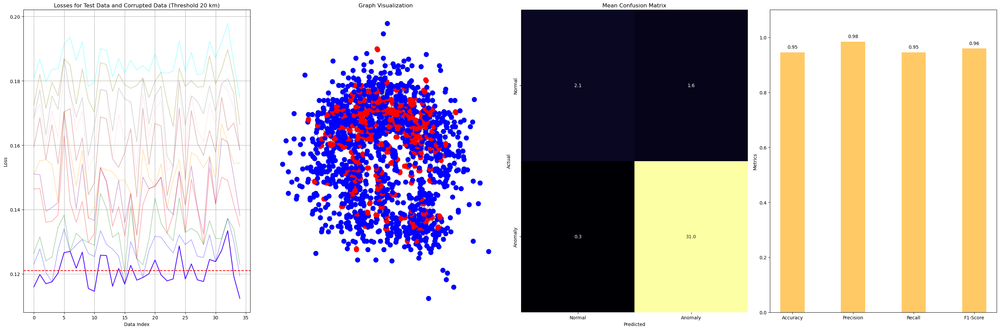

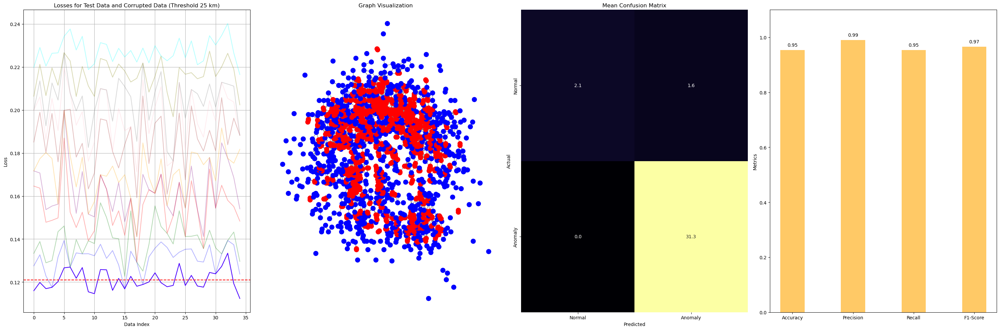

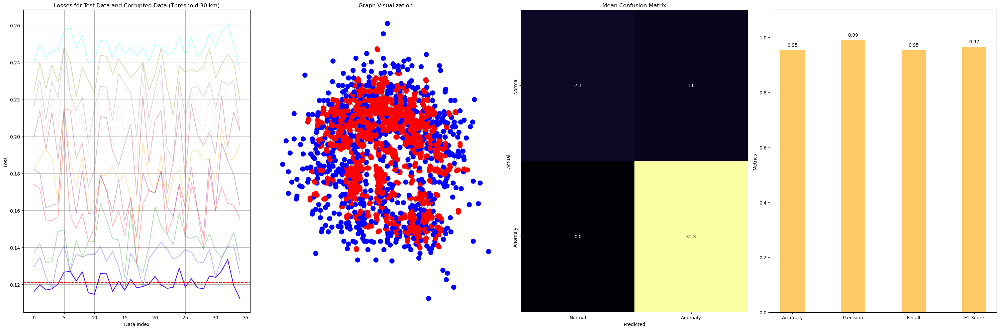

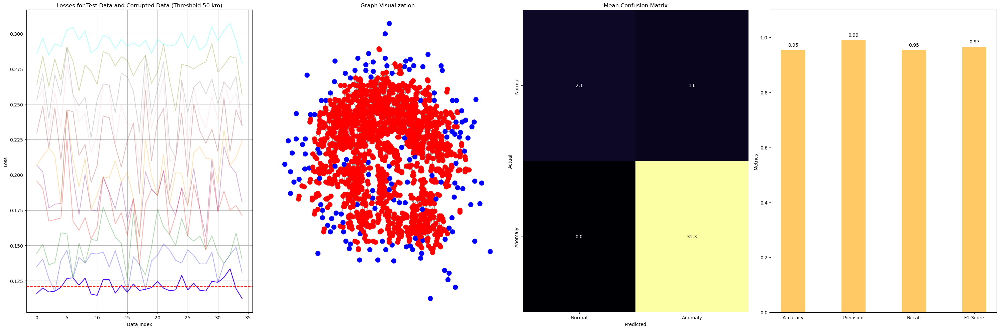

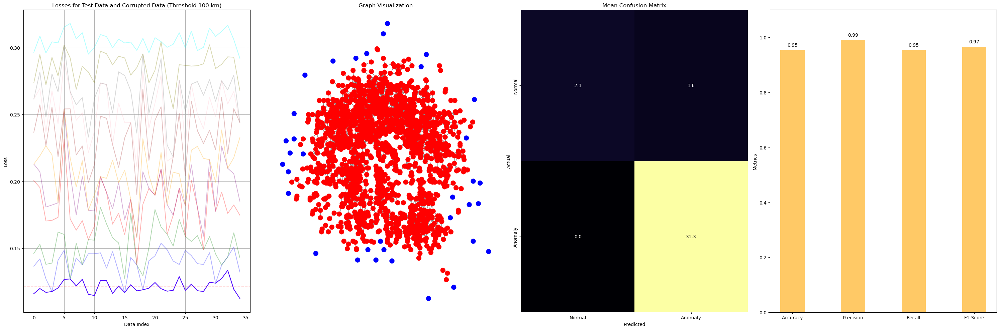

In [56]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import torch
from torch.utils.data import DataLoader
import networkx as nx
from torch_geometric.utils import to_networkx

# Constants
corruption_levels = [i / 10 for i in range(11)]  # Levels from 0.0 to 1.0
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink', 'gray', 'olive', 'cyan', 'magenta']

for threshold in [10, 11, 12, 13, 14, 15, 20, 25, 30, 50, 100]:
    DATA_PATH_CORRUPTED = f'data/subdata_extended_corrupted_{threshold}km/'
    fig, axes = plt.subplots(1, 4, figsize=(30, 10))  # Subplots for different visualizations

    ax1, ax2, ax3, ax4 = axes  # Unpack subplots

    # Original test losses
    ax1.plot(test_losses, label='Test Loss', color='blue')

    mean_class_rep = []
    mean_cm = []

    for corruption_level in corruption_levels:
        # Load corrupted data
        _, indices, data_corrupted = load_data(DATA_PATH_TEST, DATA_PATH_CORRUPTED, corruption_level)
        indices = indices[int((TRAIN_RATIO + VAL_RATIO) * len(data_corrupted)):]
        data_corrupted = data_corrupted[int((TRAIN_RATIO + VAL_RATIO) * len(data_corrupted)):]

        corrupted_loader = DataLoader(data_corrupted, batch_size=TEST_BATCH_SIZE, shuffle=False)

        # Detect anomalies
        corrupted_losses, _, corrupted_anomalies = detect_anomalies(model, corrupted_loader, criterion, threshold=anomaly_threshold)

        # Plot corrupted losses
        color_idx = min(int(corruption_level * 10) - 1, len(colors) - 1)
        ax1.plot(corrupted_losses, label=f'Corruption {corruption_level:.1f}', alpha=0.3, color=colors[color_idx])

        # Metrics calculations
        actual_anomalies = [1 if i > 0 else 0 for i in indices]
        predicted_anomalies = [1 if i in corrupted_anomalies else 0 for i in range(len(indices))]

        # Classification report and confusion matrix
        class_rep = classification_report(
            actual_anomalies, predicted_anomalies, target_names=['Normal', 'Anomaly'], output_dict=True, labels=[0, 1]
        )
        cm = confusion_matrix(actual_anomalies, predicted_anomalies, labels=[0, 1])

        mean_class_rep.append(class_rep)
        mean_cm.append(cm)

    # Calculate mean metrics
    mean_cm = np.mean(mean_cm, axis=0)
    mean_accuracy = np.mean([rep['accuracy'] for rep in mean_class_rep])
    mean_class_rep = {metric: np.mean([rep['weighted avg'][metric] for rep in mean_class_rep])
                      for metric in ['precision', 'recall', 'f1-score']}

    # Prepare metrics for bar plot
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    metric_values = [mean_accuracy] + [mean_class_rep[m] for m in ['precision', 'recall', 'f1-score']]

    # Plot mean confusion matrix as heatmap
    sns.heatmap(mean_cm, annot=True, fmt='.1f', cmap='inferno', cbar=False,
                xticklabels=['Normal', 'Anomaly'], yticklabels=['Normal', 'Anomaly'], ax=ax3)
    ax3.set_title('Mean Confusion Matrix')
    ax3.set_xlabel('Predicted')
    ax3.set_ylabel('Actual')

    # Plot metrics bar chart
    ax4.bar(metrics, metric_values, alpha=0.6, color='orange', width=0.4)
    ax4.set_ylim(0, 1.1)
    ax4.set_ylabel('Metrics')
    for i, v in enumerate(metric_values):
        ax4.text(i, v + 0.01, f'{v:.2f}', ha='center', va='bottom')

    # Add anomaly threshold to ax1
    ax1.axhline(anomaly_threshold, color='red', linestyle='--', label='Anomaly Threshold')
    ax1.set_xlabel('Data Index')
    ax1.set_ylabel('Loss')
    ax1.grid(True)
    ax1.set_title(f'Losses for Test Data and Corrupted Data (Threshold {threshold} km)')

    # Graph visualization
    data_difference = test_data-data_corrupted

    # Convert data_difference to a PyTorch tensor and compute the mean
    data_difference_tensor = torch.tensor(data_difference, dtype=torch.float32)
    data_mean = torch.mean(data_difference_tensor[0, :, :, :], dim=0)
    data = Data(x=data_mean, edge_index=edge_index, edge_attr=edge_weight)
    G = to_networkx(data, to_undirected=True)
    node_colors = ['blue' if data.x[node_id].sum() == 0 else 'red' for node_id in range(len(G.nodes))]
    
    # Create a dictionary with (lat, lon) positions for each node
    positions = {node_mapping[node_id]: (node_id[1], node_id[0]) for node_id in node_ids}  # (lon, lat) for x, y
    for i in G.nodes:
        if i not in positions:
            positions[i] = (0, 0)

    nx.draw(G, pos=positions, with_labels=False, node_size=100, font_size=10,
            node_color=node_colors, edge_color='gray', ax=ax2)
    ax2.set_title('Graph Visualization')

    plt.tight_layout()
    plt.show()
